In [384]:
#Begin with importing a variety of libraries 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import seaborn as sns
import cufflinks as cf
import plotly.plotly as py
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go 
import plotly.figure_factory as ff
import shapely

%matplotlib inline

In [277]:
cf.go_offline() #Offline use for Plotly/Cufflinks
init_notebook_mode(connected=True)

# USA County Data

We'll start by gathering demographic data about US Counties. The US Department of Agriculture provides some comprehensive datasets about US counties: https://www.ers.usda.gov/data-products/atlas-of-rural-and-small-town-america/download-the-data/. There are three datasets, so we'll then merge them at the county codes (FIPS).

In [278]:
#Read in people data
peopledata = pd.read_csv('Rural_Atlas_Update18/People.csv')

# retain relevant columns
peopledata = peopledata[['FIPS','State','County','WhiteNonHispanicPct2010','BlackNonHispanicPct2010',
                         'AsianNonHispanicPct2010','NativeAmericanNonHispanicPct2010',
                         'HispanicPct2010','ForeignBornPct','ForeignBornEuropePct', 
                         'ForeignBornMexPct', 'NonEnglishHHPct','Ed1LessThanHSPct',
                         'Ed5CollegePlusPct', 'AvgHHSize', 'FemaleHHPct']]

# We'll take a quick look at the dataframe

peopledata.head(2)

,FIPS,State,County,WhiteNonHispanicPct2010,BlackNonHispanicPct2010,AsianNonHispanicPct2010,NativeAmericanNonHispanicPct2010,HispanicPct2010,ForeignBornPct,ForeignBornEuropePct,ForeignBornMexPct,NonEnglishHHPct,Ed1LessThanHSPct,Ed5CollegePlusPct,AvgHHSize,FemaleHHPct
0,0,US,United States,63.75,12.21,4.69,0.73,16.35,13.245236,1.500944,3.623026,4.487962,13.020590,30.315023,2.64,12.866629
1,1000,AL,Alabama,67.04,26.04,1.11,0.54,3.88,3.418682,0.368321,1.122457,1.197475,15.209259,24.010366,2.55,14.898753


In [279]:
# read in jobs data

jobsdata = pd.read_csv('Rural_Atlas_Update18/Jobs.csv')

# Retain the relevant columns

jobsdata = jobsdata[['FIPS','UnempRate2017','PctEmpAgriculture','PctEmpMining','PctEmpConstruction','PctEmpManufacturing','PctEmpGovt']]

jobsdata.head()

,FIPS,UnempRate2017,PctEmpAgriculture,PctEmpMining,PctEmpConstruction,PctEmpManufacturing,PctEmpGovt
0,0,NaN,1.326306,0.595097,6.254428,10.348796,4.714442
1,1000,4.4,1.127851,0.475166,6.412311,14.040817,5.566631
2,1001,3.9,0.647102,0.564669,4.809991,13.997197,11.928118
3,1003,4.0,0.943557,0.501407,7.722813,9.237291,4.755393
4,1005,5.9,4.358946,0.166796,6.304904,22.406316,7.161125


In [280]:
# read in income/finance data

incomedata = pd.read_csv('Rural_Atlas_Update18/Income.csv')

# Retain the columns of interest
incomedata = incomedata[['FIPS','PovertyAllAgesPct','PerCapitaInc']]

incomedata.head(1)

,FIPS,PovertyAllAgesPct,PerCapitaInc
0,0,14.0,29829.0


In [281]:
# Merge all three together on the "FIPS" column,
# which are unique county codes. 
county_data = peopledata.merge(jobsdata,on='FIPS').merge(incomedata,on='FIPS')
county_data.head(2)

,FIPS,State,County,WhiteNonHispanicPct2010,BlackNonHispanicPct2010,AsianNonHispanicPct2010,NativeAmericanNonHispanicPct2010,HispanicPct2010,ForeignBornPct,ForeignBornEuropePct,...,AvgHHSize,FemaleHHPct,UnempRate2017,PctEmpAgriculture,PctEmpMining,PctEmpConstruction,PctEmpManufacturing,PctEmpGovt,PovertyAllAgesPct,PerCapitaInc
0,0,US,United States,63.75,12.21,4.69,0.73,16.35,13.245236,1.500944,...,2.64,12.866629,NaN,1.326306,0.595097,6.254428,10.348796,4.714442,14.0,29829.0
1,1000,AL,Alabama,67.04,26.04,1.11,0.54,3.88,3.418682,0.368321,...,2.55,14.898753,4.4,1.127851,0.475166,6.412311,14.040817,5.566631,17.2,24736.0


We'll also bring in normalized GINI index data from GitHub: https://github.com/iloveluce/mini-graph. The data is from the US Government, but a comprehensive version of the original dataset couldn't be located, so we've found an altered version that has normalized rates. The GINI score represents a measure of income inequality, with 0 being the most equal and, in this case of a normalized value, 1 being the most unequal.

In [282]:
# import GINI index data 
gini = pd.read_json('gini_data.json')
gini.head(1)

,Gini Index,Gini Margin of Error,Median Income,id,name
0,0.41,0.015,52475,1001,"Autauga County, Alabama"


In [283]:
# The 'id' column represents 'FIPS'. We'll change the name and drop all other columns.
gini['FIPS']=gini['id']
gini=gini.drop(['Gini Margin of Error','id','name'],axis=1)
gini['Gini Index'] = gini['Gini Index'].astype(float)
gini.head(1)

,Gini Index,Median Income,FIPS
0,0.41,52475,1001


In [284]:
# Join on FIPS with county_data

county_data = county_data.merge(gini,on='FIPS',how='left')
county_data.head()

,FIPS,State,County,WhiteNonHispanicPct2010,BlackNonHispanicPct2010,AsianNonHispanicPct2010,NativeAmericanNonHispanicPct2010,HispanicPct2010,ForeignBornPct,ForeignBornEuropePct,...,UnempRate2017,PctEmpAgriculture,PctEmpMining,PctEmpConstruction,PctEmpManufacturing,PctEmpGovt,PovertyAllAgesPct,PerCapitaInc,Gini Index,Median Income
0,0,US,United States,63.75,12.21,4.69,0.73,16.35,13.245236,1.500944,...,NaN,1.326306,0.595097,6.254428,10.348796,4.714442,14.0,29829.0,NaN,NaN
1,1000,AL,Alabama,67.04,26.04,1.11,0.54,3.88,3.418682,0.368321,...,4.4,1.127851,0.475166,6.412311,14.040817,5.566631,17.2,24736.0,NaN,NaN
2,1001,AL,Autauga,77.25,17.58,0.86,0.40,2.40,1.838362,0.279751,...,3.9,0.647102,0.564669,4.809991,13.997197,11.928118,13.5,26168.0,0.4100,52475.0
3,1003,AL,Baldwin,83.50,9.31,0.74,0.63,4.38,3.269510,0.609493,...,4.0,0.943557,0.501407,7.722813,9.237291,4.755393,11.7,28069.0,0.4517,50183.0
4,1005,AL,Barbour,46.75,46.69,0.39,0.22,5.05,2.859397,0.255505,...,5.9,4.358946,0.166796,6.304904,22.406316,7.161125,29.9,17249.0,0.4608,35634.0


Next, we'll bring in data about crime rates. An important note to make here is that these rates represent reported incidents of crime, rather than actual crime rates – which, in some cases, can vary significantly. This data is retrieved from the FBI: https://ucr.fbi.gov/crime-in-the-u.s/2016/crime-in-the-u.s.-2016/cius-2016.

In [285]:
# read in crime data, eliminate commas with the "thousands" command
crime = pd.read_csv('CountyOffenses.csv',thousands=',')

In [286]:
# Let's preview the crime data
crime.head()

,State,County,Violent crime,Murder and nonnegligent manslaughter,RapeRevised,RapeLegacy,Robbery,Aggravated assault,Property crime,Burglary,Larceny- theft,Motor vehicle theft,Arson
0,AL,Autauga,73.0,1.0,12.0,NaN,8.0,52.0,429.0,146.0,233.0,50.0,NaN
1,AL,Baldwin,127.0,1.0,5.0,NaN,23.0,98.0,613.0,229.0,342.0,42.0,NaN
2,AL,Bibb,0.0,0.0,0.0,NaN,0.0,0.0,37.0,20.0,14.0,3.0,NaN
3,AL,Blount,394.0,1.0,17.0,NaN,9.0,367.0,867.0,261.0,501.0,105.0,NaN
4,AL,Calhoun,23.0,0.0,7.0,NaN,5.0,11.0,319.0,137.0,181.0,1.0,NaN


In [287]:
# There was an indexing error when trying to 
# access columns. We'll see what the issue is by
# looking at the column names. 
crime.columns 

Index(['State', 'County', 'Violent\ncrime',
       'Murder and\nnonnegligent\nmanslaughter', 'RapeRevised', 'RapeLegacy',
       'Robbery', 'Aggravated assault', 'Property\ncrime', 'Burglary',
       'Larceny-\ntheft', 'Motor\nvehicle theft', 'Arson'],
      dtype='object')

In [288]:
# It appears to contain line separators '\n' 
# so we'll remove them from the column names.

crime = crime.rename({'Violent\ncrime':'Violent Crime',
                      'Murder and\nnonnegligent\nmanslaughter':'Murder and Nonnegligent Manslaughter',
                     'RapeRevised':'Rape (Revised)',
                      'RapeLegacy':'Rape (Legacy)',
                     'Aggravated assault':'Aggravated Assault',
                      'Property\ncrime':'Property Crime',
                      'Larceny-\ntheft':'Larceny-Theft',
                     'Motor\nvehicle theft':'Motor Vehicle Theft'}, axis=1)

In [289]:
# Check column names again
crime.columns

Index(['State', 'County', 'Violent Crime',
       'Murder and Nonnegligent Manslaughter', 'Rape (Revised)',
       'Rape (Legacy)', 'Robbery', 'Aggravated Assault', 'Property Crime',
       'Burglary', 'Larceny-Theft', 'Motor Vehicle Theft', 'Arson'],
      dtype='object')

In [290]:
# We'll retain the relevant columns
# The "Rape" columns were removed because of the 
# two different definitions. It significantly reduces the 
# sample size (half of the data is linked to each definition) and adversely 
# affects correlations. 

crime = crime[['State','County','Violent Crime','Murder and Nonnegligent Manslaughter',
               'Robbery','Aggravated Assault','Property Crime','Burglary']]


In [291]:
# Merge the county data 
county_data= pd.merge(county_data,crime,on=['County','State'],how='left')

Moving on, we'll add in data on average Medicare reimbursements per person. This data might be useful in analyzing medical costs associated with higher environmental contamination. Data retrieved from: https://datausa.io/map/?level=county&key=total_reimbursements_b, originally produced by the US Government. 

In [292]:
# Read in medicare data
medicare = pd.read_csv('Medicare Reimbursements.csv')

In [293]:
medicare.head(1)

,geo_name,geo_sumlevel,geo_id,total_reimbursements_b_2010,total_reimbursements_b_2011,total_reimbursements_b_2012,total_reimbursements_b_2013,total_reimbursements_b_2014
0,"Baldwin County, AL",county,05000US01003,9618.0,9569.0,9501.0,9489.0,9412.0


In [294]:
# Take the most recent data
medicare = medicare[['geo_name','total_reimbursements_b_2014']]

medicare.head(1)

,geo_name,total_reimbursements_b_2014
0,"Baldwin County, AL",9412.0


In [295]:
# Split geo_name column to 'State' and 'County'
medicare[['County', 'State']] = medicare.geo_name.str.split(', ', expand = True)

In [296]:
# Rename, convert to float, and drop unnecessary columns
medicare['medicare reimbursements (2014)'] = medicare['total_reimbursements_b_2014'].astype(float)
medicare = medicare.drop(['geo_name','total_reimbursements_b_2014'],axis=1)

In [297]:
#Clean up County column for merging

medicare['County'] = medicare.County.str.replace('County', '')
medicare['County'] = medicare.County.str.replace('City', '')   
medicare['County'] = medicare.County.str.replace('Census', '')
medicare['County'] = medicare.County.str.replace('Census-Area', '')
medicare['County'] = medicare.County.str.replace('Area', '')
medicare['County'] = medicare.County.str.replace('Borough', '')
medicare['County'] = medicare.County.str.replace('Parish', '')
medicare['County'] = medicare.County.str.replace('Municipality', '')

# .rstrip() removes whitespace at the end of a string
medicare.County = medicare.County.str.rstrip() 
medicare.State = medicare.State.str.rstrip()

In [298]:
medicare.head(1)

,County,State,medicare reimbursements (2014)
0,Baldwin,AL,9412.0


In [299]:
# Since there's no FIPS data,
# we'll merge it on the County and State columns with the larger dataset.

uscounties= pd.merge(county_data,medicare,on=['County','State'],how='left')

In [300]:
uscounties.head(1)

,FIPS,State,County,WhiteNonHispanicPct2010,BlackNonHispanicPct2010,AsianNonHispanicPct2010,NativeAmericanNonHispanicPct2010,HispanicPct2010,ForeignBornPct,ForeignBornEuropePct,...,PerCapitaInc,Gini Index,Median Income,Violent Crime,Murder and Nonnegligent Manslaughter,Robbery,Aggravated Assault,Property Crime,Burglary,medicare reimbursements (2014)
0,0,US,United States,63.75,12.21,4.69,0.73,16.35,13.245236,1.500944,...,29829.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Coming up, we'll add in water and air contamination data. 

Water data will be sourced from the Environmental Protection Agency: https://catalog.data.gov/dataset/safe-drinking-water-information-system-sdwis-federal-reports-advanced-search-tool. This dataset shows the mean value of drinking water standard violations from 1994-2016.

Air quality data also comes from the EPA: https://www.epa.gov/air-trends/air-quality-cities-and-counties.

In [301]:
watervio = pd.read_csv('mean_water_violations_1994_2016.csv')

In [302]:
watervio.head(1)

,State_County,mean_viol_cnty,State,STATE_FIPS,CNTY_FIPS,COUNTY,FIPS,FIPS2
0,AK_Aleutians West Census Area,0.043478,AK,2,16,Aleutians West Census Area,2016,f02016


In [303]:
# We only have a limited sample, although it will suffice for our purposes.
# About 1/3 of counties will be represented in our analysis. 
# This should be noted as a potential limitation.
len(watervio)

1085

In [304]:
watervio = watervio.drop(['FIPS2','CNTY_FIPS','State','State_County','STATE_FIPS','COUNTY'],axis=1)
watervio = watervio.rename({'mean_viol_cnty':'mean water violations'},axis=1)
watervio.head()

,mean water violations,FIPS
0,0.043478,2016
1,0.130435,2020
2,0.260870,2090
3,0.521739,2180
4,0.173913,2240


In [305]:
uscounties = uscounties.merge(watervio,on='FIPS',how='left')

In [306]:
# Data matched for 1078 counties.
len(uscounties[uscounties['mean water violations']>0])

1084

Now we'll introduce the air quality data:

In [307]:
air = pd.read_csv('airquality_county_2017.csv')

In [308]:
air.head()

,State,County,FIPS,2010 Population,CO 8-hr,PB 3-mo,NO2 AM,NO2 1-hr,03 8-hr,PM10 24-hr,PM2.5 Wtd AM,PM2.5 24-hr,SO2 1-hr
0,Alabama,Baldwin County,1003,182265,ND,ND,ND,ND,0.064,ND,7.4,19,ND
1,Alabama,Clay County,1027,13932,ND,ND,ND,ND,ND,ND,7.9,17,ND
2,Alabama,Colbert County,1033,54428,ND,ND,ND,ND,0.056,ND,7.4,16,ND
3,Alabama,DeKalb County,1049,71109,ND,ND,ND,ND,0.058,ND,8,17,ND
4,Alabama,Elmore County,1051,79303,ND,ND,ND,ND,0.055,ND,ND,ND,ND


In [309]:
# ND Stands for not disclosed. We'll replace them with NaN.
cols = ['2010 Population', 'CO 8-hr', 'PB 3-mo',
       'NO2 AM', 'NO2 1-hr', '03 8-hr', 'PM10 24-hr', 'PM2.5 Wtd AM',
       'PM2.5 24-hr', 'SO2 1-hr']
air[cols] = air[cols].replace({'ND':np.nan})
air[cols] = air[cols].replace({'IN':np.nan})

In [310]:
# Drop State and County columns
air = air.drop(['State','County'],axis=1)

In [311]:
# We have data for 1146 counties. Again this represents about a third of all counties.
# Again, this should be noted as a constraint.
len(air) 

1146

In [312]:
# Convert data to floats

air[['2010 Population', 'CO 8-hr', 'PB 3-mo',
       'NO2 AM', 'NO2 1-hr', '03 8-hr', 'PM10 24-hr', 'PM2.5 Wtd AM',
       'PM2.5 24-hr', 'SO2 1-hr']] = air[['2010 Population', 'CO 8-hr', 'PB 3-mo',
       'NO2 AM', 'NO2 1-hr', '03 8-hr', 'PM10 24-hr', 'PM2.5 Wtd AM',
       'PM2.5 24-hr', 'SO2 1-hr']].astype(float)

In [313]:
len(air)

1146

In [314]:
uscounties = uscounties.merge(air,on='FIPS',how='left')

In [315]:
len(uscounties[uscounties['SO2 1-hr']>0])

293

Moving forward, we'll now add in cancer mortality rates. This will be particularly interesting because it can show the serious impact that environmental contaminants can have. The data here will represent mortality rates for the year 2014. This data is retrieved from the Institute for Health Metrics: http://ghdx.healthdata.org/organizations/institute-health-metrics-and-evaluation-ihme.

In [316]:
cancer_all = pd.read_csv('county_cancer_mortality_2014.csv')

In [317]:
cancer_all.head(2)

,Location,FIPS,Cervical Cancer Mortality,Breast Cancer Mortality,Uterine Cancer Mortality,Ovarian Cancer Mortality,Prostate Cancer Mortality,Testicular Cancer Mortality,Kidney Cancer Mortality,Brain/Nervous System Cancer Mortality,...,"Trachael, Bronchus, and Lung Cancer Mortality",Larynx Cancer Mortality,Pancreatic Cancer Mortality,Gallbladder and Biliary Tract Cancer,Liver Cancer Mortality,Colon and Rectum Cancer Mortality,Stomach Cancer Mortality,Esophageal Cancer Mortality,Lip and Oral Cavity Cancer Mortality,Neoplasms Mortality
0,United States,NaN,"3.69 (3.49, 3.91)","25.88 (24.70, 30.32)","3.86 (3.28, 4.14)","8.56 (8.21, 8.94)","24.72 (20.33, 38.20)","0.26 (0.24, 0.29)","4.58 (4.41, 4.76)","4.77 (4.54, 5.16)",...,"54.17 (52.74, 55.63)","1.32 (1.25, 1.39)","12.77 (12.38, 13.19)","1.15 (1.07, 1.22)","6.81 (6.57, 7.07)","22.13 (21.48, 22.82)","4.75 (4.61, 4.89)","5.06 (4.87, 5.27)","1.82 (1.74, 1.91)","192.04 (188.60, 197.71)"
1,Alabama,1.0,"4.51 (4.26, 4.78)","30.20 (28.74, 35.56)","3.30 (2.81, 3.55)","10.08 (9.63, 10.57)","30.72 (25.45, 46.69)","0.28 (0.24, 0.33)","4.90 (4.64, 5.17)","5.39 (5.09, 5.84)",...,"73.59 (71.51, 75.72)","1.65 (1.55, 1.76)","14.24 (13.78, 14.75)","0.97 (0.89, 1.04)","7.54 (7.11, 7.92)","27.72 (26.86, 28.64)","5.48 (5.27, 5.68)","5.32 (5.07, 5.60)","2.27 (2.14, 2.41)","230.98 (226.51, 238.32)"


In [318]:
# It looks like there are confidence intervals included in the data.
# We'll clean the data to only grab the first value, rather than the interval. 

# First, we'll create a function that splits a string at the spaces
# then takes the first element of the split string - in this case, the value we're looking for. 

def splitrates(x):
    try:
         return float(x.split()[0])
    except: 
        pass

# Next we'll apply this to every cell in the DataFrame. 

cancer = cancer_all.applymap(splitrates)

In [319]:
cancer['FIPS'] = cancer_all['FIPS']
cancer['Location'] = cancer_all['Location']

In [320]:
# Drop USA Value, as it is NaN and prevents conversion of FIPS to integers
cancer = cancer.drop(0)
cancer.head(1)

,Location,FIPS,Cervical Cancer Mortality,Breast Cancer Mortality,Uterine Cancer Mortality,Ovarian Cancer Mortality,Prostate Cancer Mortality,Testicular Cancer Mortality,Kidney Cancer Mortality,Brain/Nervous System Cancer Mortality,...,"Trachael, Bronchus, and Lung Cancer Mortality",Larynx Cancer Mortality,Pancreatic Cancer Mortality,Gallbladder and Biliary Tract Cancer,Liver Cancer Mortality,Colon and Rectum Cancer Mortality,Stomach Cancer Mortality,Esophageal Cancer Mortality,Lip and Oral Cavity Cancer Mortality,Neoplasms Mortality
1,Alabama,1.0,4.51,30.2,3.3,10.08,30.72,0.28,4.9,5.39,...,73.59,1.65,14.24,0.97,7.54,27.72,5.48,5.32,2.27,230.98


In [321]:
#Take only rows with a valid FIPS value
cancer = cancer[np.isfinite(cancer['FIPS'])]

In [322]:
#Convert all FIPS to integers so they will merge with the rest of the dataset.
cancer.FIPS = [int(i) for i in cancer.FIPS]

In [323]:
uscounties = uscounties.merge(cancer,on='FIPS',how='left')

Theres one more dataset about cancer we'll use from the CDC: https://www.cdc.gov/cancer/uscs/dataviz/download_data.htm, https://gis.cdc.gov/Cancer/USCS/DataViz.html. It describes cancer rates per 100,000 by county, 1994-2014.

In [324]:
cdc = pd.read_csv('USCS_1999_2015_ASCII/BYAREA_COUNTY.txt',sep='|')

In [325]:
# We'll filter the columns to only include cancer incident rates,
# all kinds of cancer, for both male and females; and data for all races. 
cdc = cdc[(cdc['SITE']=='All Cancer Sites Combined') & (cdc['EVENT_TYPE']=='Incidence') & (cdc['SEX']=='Male and Female') & (cdc['RACE']=='All Races')]
cdc.head()

,STATE,AREA,AGE_ADJUSTED_CI_LOWER,AGE_ADJUSTED_CI_UPPER,AGE_ADJUSTED_RATE,COUNT,EVENT_TYPE,POPULATION,RACE,SEX,SITE,YEAR,CRUDE_CI_LOWER,CRUDE_CI_UPPER,CRUDE_RATE
95,AK,AK: Aleutians East Borough (02013) - 1994+,148.3,393.6,251.4,25,Incidence,16451,All Races,Male and Female,All Cancer Sites Combined,2011-2015,98.3,224.3,152.0
971,AK,AK: Aleutians West Census Area (02016) - 1994+,245.0,542.7,375.6,62,Incidence,28508,All Races,Male and Female,All Cancer Sites Combined,2011-2015,166.7,278.8,217.5
1847,AK,AK: Anchorage Municipality (02020) - 1990+,416.1,440.6,428.2,5496,Incidence,1494808,All Races,Male and Female,All Cancer Sites Combined,2011-2015,358.0,377.5,367.7
2723,AK,AK: Bethel Census Area (02050) - 1990+,269.6,370.9,317.5,187,Incidence,88925,All Races,Male and Female,All Cancer Sites Combined,2011-2015,181.2,242.7,210.3
3599,AK,AK: Bristol Bay Borough (02060) - 1990+,280.8,706.1,455.6,25,Incidence,4808,All Races,Male and Female,All Cancer Sites Combined,2011-2015,336.5,767.6,520.0


In [326]:
# Grab FIPS values that are between the parentheses in 'AREA' column
cdc['FIPS'] = [int(i.split('(')[1].split(')')[0]) for i in cdc.AREA]

In [327]:
#Rename rows
cdc = cdc[['AGE_ADJUSTED_RATE','FIPS']].rename({'AGE_ADJUSTED_RATE':'cancer_rate'},axis=1)

In [328]:
# The rates are input as strings and the dataset contains "~" and "." for unavailable data.
# We'll convert them to floats and 'coerce' the string values to NaN

cdc['cancer_rate'] = pd.to_numeric(cdc['cancer_rate'],errors='coerce')

In [329]:
cdc.head()

,cancer_rate,FIPS
95,251.4,2013
971,375.6,2016
1847,428.2,2020
2723,317.5,2050
3599,455.6,2060


In [330]:
uscounties = uscounties.merge(cdc,on=['FIPS'],how='left')

Next, we'll read in TRI Release data from: https://www.epa.gov/trinationalanalysis/supporting-data-files-2016-tri-national-analysis. This data is about toxic waste release in counties in 2016. An often referenced factor in environmental justice is the release of these toxins and chemicals. 

In [331]:
# There are commas in the values so we'll 
# use the 'thousands' parameter to remove them.
tri = pd.read_csv('county_release_data.csv',thousands=',')

In [332]:
tri.head(1)

,FIPS,County Name,State Abbreviation,Count of Total Facilities,Total Gross Releases (lb),Gross Releases per Sq Mile (lb),Rank Based on Gross Releases per Sq Mile,Count of Facilities reporting Water Releases,Water Releases (lb),Water Releases per Sq Mile (lb),...,Land Releases (lb),Land Releases per Sq Mile (lb),Rank Based on Land Releases per Sq Mile,Population (2010),RSEI Pounds,RSEI Hazard,RSEI Score,Rank Based on RSEI Pounds,Rank Based on RSEI Hazard,Rank Based on RSEI Score
0,2013,Aleutians East,AK,NaN,0.0,NaN,0,NaN,0.0,NaN,...,0.0,NaN,0,3141.0,0.0,0.0,0.0,0,0,0


In [333]:
# We'll remove redundant columns, then join it with the US Counties dataframe
tri = tri.drop(['County Name','State Abbreviation','Population (2010)'],axis=1)

In [334]:
# Append to uscounties
uscounties = uscounties.merge(tri,on=['FIPS'],how='left')

To finish up, we'll add in data that represents the diversity of a county using the Simpson index, found on Kaggle here: https://www.kaggle.com/mikejohnsonjr/us-counties-diversity-index/home.

In [335]:
diversityindex = pd.read_csv('countydiversityindex.csv')
diversityindex.head()

,Location,Diversity-Index,"Black or African American alone, percent, 2013","American Indian and Alaska Native alone, percent, 2013","Asian alone, percent, 2013","Native Hawaiian and Other Pacific Islander alone, percent,","Two or More Races, percent, 2013","Hispanic or Latino, percent, 2013","White alone, not Hispanic or Latino, percent, 2013"
0,"Aleutians West Census Area, AK",0.769346,7.4,13.8,31.1,2.3,4.8,14.6,29.2
1,"Queens County, NY",0.742224,20.9,1.3,25.2,0.2,2.7,28.0,26.7
2,"Maui County, HI",0.740757,0.8,0.6,28.8,10.6,23.3,10.7,31.5
3,"Alameda County, CA",0.740399,12.4,1.2,28.2,1.0,5.2,22.7,33.2
4,"Aleutians East Borough, AK",0.738867,7.7,21.8,41.4,0.7,3.7,13.5,12.9


In [336]:
#This data has location and state in the same columns, as well as no FIPS data. 
#To merge it, we should try to isolate county names, then merge on both county name and state (as many counties share names) )

#Looking at the data, the county name should appear before the comma in the location column.
#We can split the name at the column, then add everything before the comma to a new column.
diversityindex[['County','State']] = diversityindex.Location.str.split(',', expand=True)
diversityindex.head(3)


,Location,Diversity-Index,"Black or African American alone, percent, 2013","American Indian and Alaska Native alone, percent, 2013","Asian alone, percent, 2013","Native Hawaiian and Other Pacific Islander alone, percent,","Two or More Races, percent, 2013","Hispanic or Latino, percent, 2013","White alone, not Hispanic or Latino, percent, 2013",County,State
0,"Aleutians West Census Area, AK",0.769346,7.4,13.8,31.1,2.3,4.8,14.6,29.2,Aleutians West Census Area,AK
1,"Queens County, NY",0.742224,20.9,1.3,25.2,0.2,2.7,28.0,26.7,Queens County,NY
2,"Maui County, HI",0.740757,0.8,0.6,28.8,10.6,23.3,10.7,31.5,Maui County,HI


In [337]:
#The counties are listed only by name. 
#We need to remove all mentions of "County","City",and "Borough" from the diversity index.

terms = ['City','Borough','County','Census','Area']   
diversityindex['County'] = diversityindex.County.str.replace('County', '') #There are errors adding the list in.
diversityindex['County'] = diversityindex.County.str.replace('City', '')   #Each term will be done separately.
diversityindex['County'] = diversityindex.County.str.replace('Census', '')
diversityindex['County'] = diversityindex.County.str.replace('Area', '')
diversityindex['County'] = diversityindex.County.str.replace('Borough', '')
diversityindex['County'] = diversityindex.County.str.replace('Parish', '')
diversityindex.head()

,Location,Diversity-Index,"Black or African American alone, percent, 2013","American Indian and Alaska Native alone, percent, 2013","Asian alone, percent, 2013","Native Hawaiian and Other Pacific Islander alone, percent,","Two or More Races, percent, 2013","Hispanic or Latino, percent, 2013","White alone, not Hispanic or Latino, percent, 2013",County,State
0,"Aleutians West Census Area, AK",0.769346,7.4,13.8,31.1,2.3,4.8,14.6,29.2,Aleutians West,AK
1,"Queens County, NY",0.742224,20.9,1.3,25.2,0.2,2.7,28.0,26.7,Queens,NY
2,"Maui County, HI",0.740757,0.8,0.6,28.8,10.6,23.3,10.7,31.5,Maui,HI
3,"Alameda County, CA",0.740399,12.4,1.2,28.2,1.0,5.2,22.7,33.2,Alameda,CA
4,"Aleutians East Borough, AK",0.738867,7.7,21.8,41.4,0.7,3.7,13.5,12.9,Aleutians East,AK


In [338]:
#Drop redundant column
diversityindex = diversityindex.drop(['Location'],axis=1)

In [339]:
#There are some states written in uppercase.
#Counties follow the "title" format, so we can remove the states by filtering by ".istitle".

diversityindex = diversityindex[diversityindex.County.str.istitle()]
diversityindex = diversityindex.astype(float,errors='ignore')
diversityindex.head(3)


,Diversity-Index,"Black or African American alone, percent, 2013","American Indian and Alaska Native alone, percent, 2013","Asian alone, percent, 2013","Native Hawaiian and Other Pacific Islander alone, percent,","Two or More Races, percent, 2013","Hispanic or Latino, percent, 2013","White alone, not Hispanic or Latino, percent, 2013",County,State
0,0.769346,7.4,13.8,31.1,2.3,4.8,14.6,29.2,Aleutians West,AK
1,0.742224,20.9,1.3,25.2,0.2,2.7,28.0,26.7,Queens,NY
2,0.740757,0.8,0.6,28.8,10.6,23.3,10.7,31.5,Maui,HI


In [340]:
#For some reason, the data is not merging. 
county_data_test = pd.merge(uscounties,diversityindex,on=['County','State'])
county_data_test.head()

,FIPS,State,County,WhiteNonHispanicPct2010,BlackNonHispanicPct2010,AsianNonHispanicPct2010,NativeAmericanNonHispanicPct2010,HispanicPct2010,ForeignBornPct,ForeignBornEuropePct,...,Rank Based on RSEI Hazard,Rank Based on RSEI Score,Diversity-Index,"Black or African American alone, percent, 2013","American Indian and Alaska Native alone, percent, 2013","Asian alone, percent, 2013","Native Hawaiian and Other Pacific Islander alone, percent,","Two or More Races, percent, 2013","Hispanic or Latino, percent, 2013","White alone, not Hispanic or Latino, percent, 2013"


In [341]:
#To problemshoot, we'll check the datatypes. 
type(diversityindex['County'][10]), type(uscounties['County'][10]) 


(str, str)

In [342]:
#Both appear to be strings, so there should not be an issue.
# We'll check corresponding lengths to see if there are any issues

print(len(diversityindex['County'][10]), len(uscounties['County'][10]),
      "\n",len(diversityindex['State'][10]), len(county_data['State'][10]))   
#The length is different, there may be extra spaces.

9 8 
 3 2


In [343]:
# We'll try removing double spaces

diversityindex.County = diversityindex.County.str.replace('  ','')      
diversityindex.State = diversityindex.State.str.replace('  ','')
uscounties_test_2 = pd.merge(county_data,diversityindex,on='County')
len(uscounties_test_2) 

12

In [344]:
# Now instead of 0, we have matched 12
# Identifying the length issue may have been essential. Removing a single space at the end of a word may be difficult.
# If we use the same procedure as the double-space, we will lose the space inbetween multiple-word strings.
# Luckily, there is a specialized command:
# .rstrip() removes whitespace at the end of a string.

diversityindex.County = diversityindex.County.str.rstrip() 
diversityindex.State = diversityindex.State.str.rstrip()
diversityindex.State = diversityindex.State.str.replace(' ','')

In [345]:
# Now we can try to merge the datasets again:
uscounties = pd.merge(uscounties,diversityindex,on=['County','State'],how='left')

# We're merging using how='left' just in case the Kaggle dataset is incomplete
uscounties.head(10)

,FIPS,State,County,WhiteNonHispanicPct2010,BlackNonHispanicPct2010,AsianNonHispanicPct2010,NativeAmericanNonHispanicPct2010,HispanicPct2010,ForeignBornPct,ForeignBornEuropePct,...,Rank Based on RSEI Hazard,Rank Based on RSEI Score,Diversity-Index,"Black or African American alone, percent, 2013","American Indian and Alaska Native alone, percent, 2013","Asian alone, percent, 2013","Native Hawaiian and Other Pacific Islander alone, percent,","Two or More Races, percent, 2013","Hispanic or Latino, percent, 2013","White alone, not Hispanic or Latino, percent, 2013"
0,0,US,United States,63.75,12.21,4.69,0.73,16.35,13.245236,1.500944,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000,AL,Alabama,67.04,26.04,1.11,0.54,3.88,3.418682,0.368321,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1001,AL,Autauga,77.25,17.58,0.86,0.40,2.40,1.838362,0.279751,...,349.0,410.0,0.388898,18.4,0.5,1.1,0.1,1.7,2.7,75.9
3,1003,AL,Baldwin,83.50,9.31,0.74,0.63,4.38,3.269510,0.609493,...,169.0,146.0,0.297942,9.5,0.7,0.9,0.1,1.5,4.6,83.1
4,1005,AL,Barbour,46.75,46.69,0.39,0.22,5.05,2.859397,0.255505,...,1361.0,1407.0,0.556605,47.6,0.6,0.5,0.2,0.9,4.8,46.3
5,1007,AL,Bibb,75.02,21.92,0.10,0.28,1.77,1.351232,0.190502,...,1487.0,944.0,0.394100,22.1,0.4,0.2,0.1,0.9,2.1,74.6
6,1009,AL,Blount,88.89,1.26,0.20,0.50,8.07,4.271801,0.188895,...,1843.0,1732.0,0.221056,1.8,0.6,0.3,0.1,1.1,8.7,87.8
7,1011,AL,Bullock,21.92,69.97,0.18,0.18,7.12,1.516300,0.217968,...,1752.0,2093.0,0.455794,69.9,0.8,0.3,0.8,1.0,7.8,22.2
8,1013,AL,Butler,54.06,43.19,0.83,0.28,0.91,1.395464,0.024655,...,1933.0,2090.0,0.523370,43.6,0.4,1.0,0.0,0.7,1.2,53.5
9,1015,AL,Calhoun,73.61,20.39,0.70,0.40,3.28,2.393794,0.420251,...,185.0,89.0,0.420387,20.9,0.5,0.8,0.1,1.6,3.5,73.1


# USA Shapefiles
Next, we'll build a Geodataframe. This allows for the choropleth plots of our data. We'll use shapefiles of the US counties and merge them with our uscounties dataframe. The shapefiles are available from the US census Bureau: https://www.census.gov/geo/maps-data/data/cbf/cbf_counties.html

In [346]:
countyshapes = gpd.read_file('UScb_county_shapefile/cb_2017_us_county_20m.shp')
countyshapes['FIPS'] = countyshapes['GEOID'].astype(int)
countyshapes.head(2)

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,FIPS
0,06,075,00277302,0500000US06075,06075,San Francisco,06,121485107,479107241,"POLYGON ((-122.511983 37.77113, -122.465396 37...",6075
1,25,025,00606939,0500000US25025,25025,Suffolk,06,150855462,160479920,"POLYGON ((-71.19115499999999 42.283059, -71.15...",25025


In [347]:
#We'll merge the datasets on FIPS and see if this works for choropleths with shapefiles.
uscounties= countyshapes.merge(uscounties,on='FIPS')
uscounties.head(2)      #To plot using shapefile data, it must be in the GeoPandas Dataframe format.
                            #This is why we've created a new dataframe with a new name. 

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,...,Rank Based on RSEI Hazard,Rank Based on RSEI Score,Diversity-Index,"Black or African American alone, percent, 2013","American Indian and Alaska Native alone, percent, 2013","Asian alone, percent, 2013","Native Hawaiian and Other Pacific Islander alone, percent,","Two or More Races, percent, 2013","Hispanic or Latino, percent, 2013","White alone, not Hispanic or Latino, percent, 2013"
0,06,075,00277302,0500000US06075,06075,San Francisco,06,121485107,479107241,"POLYGON ((-122.511983 37.77113, -122.465396 37...",...,0.0,0.0,0.679829,6.0,0.8,34.4,0.5,4.1,15.3,41.6
1,25,025,00606939,0500000US25025,25025,Suffolk,06,150855462,160479920,"POLYGON ((-71.19115499999999 42.283059, -71.15...",...,1097.0,673.0,0.660503,24.5,0.8,8.7,0.2,2.9,21.3,47.5


In [348]:
# Remove erroneous commas that appeared in the Burglary column

uscounties['Burglary'] = uscounties['Burglary'].replace(',','')

In [349]:
# Export as a csv
uscounties.to_csv('county_data_111.csv')

# Sample Choropleth of US Counties

We now have the uscounties dataframe, which is a comprehensive collection of statistics about US counties. Let's make a sample choropleth.


/anaconda3/lib/python3.6/site-packages/matplotlib/colors.py:504: RuntimeWarning:

invalid value encountered in less



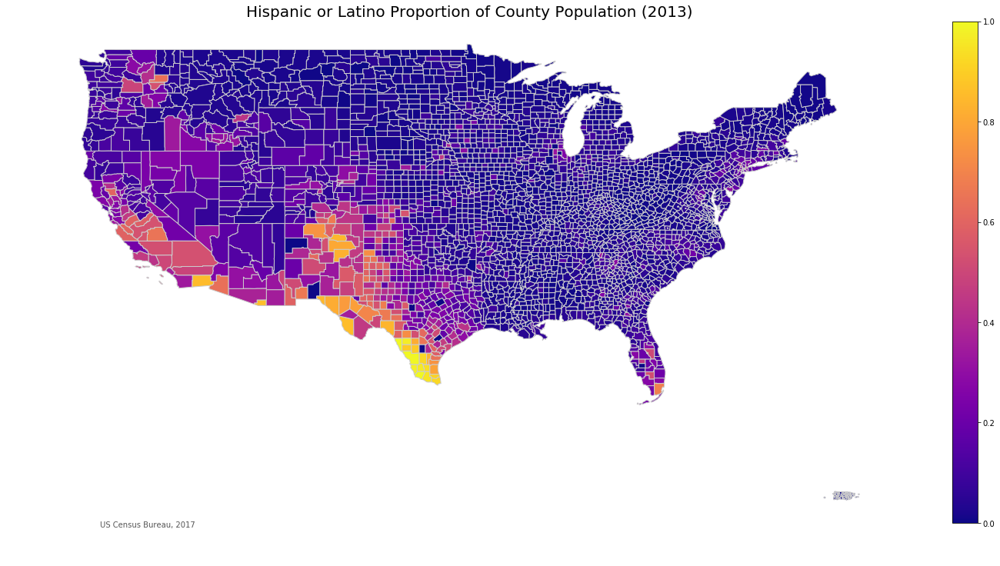

In [350]:
# This variable is easy to change and is what will be included on the map

argument = 'Hispanic or Latino, percent, 2013' 
                             # It is called in .plot() as the column argument

vmin, vmax = 0, 1            # Similarly, these arguments are the max/min values for the legend. 
                             # Again, easy to change if we change the variable.
    
fig, ax = plt.subplots(1, figsize=(25, 12))

#Alaska and Hawaii make the formatting of the map awkward, so they are omitted from the visualization. 
#They can be visualized separately, if necessary.

uscounties[(uscounties['State']!='AK')&(uscounties['State']!='HI')].plot(column=argument, 
                                            cmap='plasma', linewidth=1.0, ax=ax, edgecolor='0.8')
ax.axis('off')

#Title
ax.set_title('Hispanic or Latino Proportion of County Population (2013)', \
              fontdict={'fontsize': '20',
                        'fontweight' : '5'})

#Source Annotation
ax.annotate('US Census Bureau, 2017',
           xy=(0.1, .08), xycoords='figure fraction',
           horizontalalignment='left', verticalalignment='top',
           fontsize=10, color='#555555')

#Colorbar Legend
sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm)

# There will be an error resulting from some null values.
# This is due to incomplete data in the Kaggle diversity dataset.
# NaN values are plotted as 0. Although there are some clear outliers from this, general trends are still observable.

We can use Plotly for an interactive choropleth. Plotly takes in the FIPS data and builds a map around it:

In [351]:
#plotly.tools.set_credentials_file(username='chasemcd', api_key='eE22MdAcTKR4rztgcYXt') #If Plotly isn't working offline, remove '#' 
                                                                                        #Ive added my account so the plots will work.
fips_data = uscounties['FIPS']
values = uscounties['UnempRate2017'].round(2) #Here we are mapping the percentage of county votes for the GOP in the 2016 election
layout = go.Layout(showlegend=False)

    
fig = ff.create_choropleth(fips=fips_data, values = values,
                           round_legend_values=True,legend_title='Unemployment Rate',
                           title='Unemployment Rate by County (2017)')
iplot(fig,show_link=False)

#There will be several errors, but we can ignore them. 
#The first is a sort error with the current version of Pyplot.
#The second is an error that references state and country level FIPS codes, which throws an error because we are plotting by county.

/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:6201: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False




# Analysis
We'll now move into our the data analysis portion of the project. 
This will include statistical correlations as well as exploration through visualization.

In [352]:
# Let's get a dataframe of the correlations between our variables
# This will be quite a large table, and is simply exploratory. 
# It can act as a springboard for further analysis. 

corrtable = uscounties.corr(method='spearman').abs().unstack()
unstack = corrtable.sort_values(kind="quicksort", ascending=False)
corr_df = pd.DataFrame(unstack)
corr_df.head(1) #Unable to rename column '0' or index it. 

,,0
"White alone, not Hispanic or Latino, percent, 2013","White alone, not Hispanic or Latino, percent, 2013",1.0


In [353]:
#Export and Reimport as CSV to rename column '0' and variable colums

corr_df.to_csv('Corr Dataframe - Column Names Missing.csv')

In [354]:
correlations = pd.read_csv('Corr Dataframe.csv')
correlations.head(1)

,var1,var2,corr
0,"White alone, not Hispanic or Latino, percent, ...","White alone, not Hispanic or Latino, percent, ...",1.0


In [355]:
#Elimite rows where var1 and var2 are equal
correlations = correlations[correlations['var1']!=correlations['var2']]

# The 10 highest correlations with median income:
correlations[correlations['var1']=='Median Income'].head(10)

,var1,var2,corr
229,Median Income,PovertyAllAgesPct,0.843731
231,Median Income,PovertyUnder18Pct,0.843622
467,Median Income,Ed5CollegePlusPct,0.644450
511,Median Income,Ed1LessThanHSPct,0.626848
543,Median Income,Cervical Cancer Mortality,0.620383
700,Median Income,Lip and Oral Cavity Cancer Mortality,0.571603
794,Median Income,Larynx Cancer Mortality,0.553157
859,Median Income,Neoplasms Mortality,0.537546
909,Median Income,Colon and Rectum Cancer Mortality,0.523841
973,Median Income,"Trachael, Bronchus, and Lung Cancer Mortality",0.509040


In [356]:
# The 10 highest correlations with PM2.5 air contamination:
correlations[correlations['var1']=='PM2.5 24-hr'].head(10)

,var1,var2,corr
387,PM2.5 24-hr,PM2.5 Wtd AM,0.686521
719,PM2.5 24-hr,PM10 24-hr,0.566672
825,PM2.5 24-hr,CO 8-hr,0.546432
2037,PM2.5 24-hr,Native Hawaiian and Other Pacific Islander alo...,0.364339
2116,PM2.5 24-hr,NO2 1-hr,0.358037
2339,PM2.5 24-hr,ForeignBornMexPct,0.342418
2386,PM2.5 24-hr,MultipleRacePct2010,0.338086
2520,PM2.5 24-hr,"Hispanic or Latino, percent, 2013",0.330139
2562,PM2.5 24-hr,HispanicPct2010,0.326930
2570,PM2.5 24-hr,NO2 AM,0.326699


In [357]:
# Now we'll look at statistically significant correlations: That is, the Spearman correlation with p-values.
# We'll use variables that represent demographic information and environmental justice factors. 

# First, import the stats package:

from scipy.stats.stats import spearmanr

In [358]:
# Remove identifying columns – that is, those that
# aren't variables we'll be calculating correlations from
cols = [x for x in list(uscounties.columns) if x not in ['STATEFP','COUNTYFP','COUNTYNS','AFFGEOID',
                                        'GEOID','NAME','LSAD','ALAND','AWATER',
                                        'geometry','FIPS','State','County']]

In [359]:
# We'll split the the columns into two lists: 
# one that represents demographic information, 
# another that represents environmental factors

all_env = [ 'mean water violations','CO 8-hr','PB 3-mo','NO2 AM','NO2 1-hr',
       '03 8-hr','PM10 24-hr','PM2.5 Wtd AM','PM2.5 24-hr','SO2 1-hr','Cervical Cancer Mortality',
       'Breast Cancer Mortality','Uterine Cancer Mortality','Ovarian Cancer Mortality',
       'Prostate Cancer Mortality','Testicular Cancer Mortality','Kidney Cancer Mortality',
       'Brain/Nervous System Cancer Mortality','Mesothelioma Mortality ','Hodgkin Lymphoma Mortality',
       'Leukemia Mortality','Multiple Myeloma Mortality','Thyroid Cancer Mortality','Bladder Cancer Mortality',
       'Trachael, Bronchus, and Lung Cancer Mortality','Larynx Cancer Mortality','Pancreatic Cancer Mortality',
       'Gallbladder and Biliary Tract Cancer','Liver Cancer Mortality','Colon and Rectum Cancer Mortality',
       'Stomach Cancer Mortality','Esophageal Cancer Mortality','Lip and Oral Cavity Cancer Mortality',
       'Neoplasms Mortality','cancer_rate','Location','Count of Total Facilities','Total Gross Releases (lb)',
        'Gross Releases per Sq Mile (lb)','Rank Based on Gross Releases per Sq Mile',
        'Count of Facilities reporting Water Releases','Water Releases (lb)','Water Releases per Sq Mile (lb)',
        'Rank Based on Water Releases per Sq Mile','Count of Facilities reporting Air Releases','Air Releases (lb)',
           'Air Releases per Sq Mile (lb)','Rank Based on Air Releases per Sq Mile',
           'Count of Facilities Reporting Land Releases','Land Releases (lb)','Land Releases per Sq Mile (lb)',
           'Rank Based on Land Releases per Sq Mile','RSEI Pounds','RSEI Hazard','RSEI Score',
           'Rank Based on RSEI Pounds','Rank Based on RSEI Hazard','Rank Based on RSEI Score']

demo = [x for x in cols if x not in all_env]

env = [ 'mean water violations','PB 3-mo',
       '03 8-hr','PM2.5 24-hr','cancer_rate','Breast Cancer Mortality',
       'Trachael, Bronchus, and Lung Cancer Mortality','Colon and Rectum Cancer Mortality','Air Releases (lb)',
      'RSEI Hazard','RSEI Score','RSEI Pounds','Land Releases (lb)','Water Releases (lb)','Total Gross Releases (lb)',
      'Count of Total Facilities']

In [360]:
# create an empty DataFrame to store the data in

corr_data = {'variable_1':[],'variable_2':[],'spearman_correlation':[],'p-value':[]}
spearman = pd.DataFrame(data=corr_data)
spearman.reset_index()

,index,variable_1,variable_2,spearman_correlation,p-value


In [361]:
# Create all empty cells

for i in range(len(env)*len(demo)):
    spearman.loc[i] = np.nan

In [362]:
# Iterate through all the variables and append the relevant information.

count = 0
for i in demo:
    for x in env:
        corr, p_value = spearmanr(uscounties[i],uscounties[x],nan_policy='omit')
        spearman['variable_1'][count] = i
        spearman['variable_2'][count] = x
        spearman['spearman_correlation'][count] = corr
        spearman['p-value'][count] = float(p_value)
        count += 1

In [363]:
# Take only statistically significant correlations (p<0.05)
spearman = spearman[spearman['p-value']<0.05]

# Sort by correlation
spearman = spearman.sort_values('spearman_correlation',ascending=False)

In [378]:
# Now we'll take a look at the correlations

spearman[0:10]

,variable_1,variable_2,spearman_correlation,p-value
495,2010 Population,Count of Total Facilities,0.735020,3.176240e-180
490,2010 Population,RSEI Score,0.574975,9.844491e-102
197,FemaleHHPct,Breast Cancer Mortality,0.553801,4.579367e-252
47,AsianNonHispanicPct2010,Count of Total Facilities,0.531568,1.336368e-176
311,PovertyAllAgesPct,Colon and Rectum Cancer Mortality,0.518254,1.744326e-215
310,PovertyAllAgesPct,"Trachael, Bronchus, and Lung Cancer Mortality",0.509823,1.900300e-207
21,BlackNonHispanicPct2010,Breast Cancer Mortality,0.507350,3.385472e-205
559,"Asian alone, percent, 2013",Count of Total Facilities,0.503389,2.392615e-148
150,Ed1LessThanHSPct,"Trachael, Bronchus, and Lung Cancer Mortality",0.489882,2.259859e-189
517,"Black or African American alone, percent, 2013",Breast Cancer Mortality,0.487682,2.653168e-181


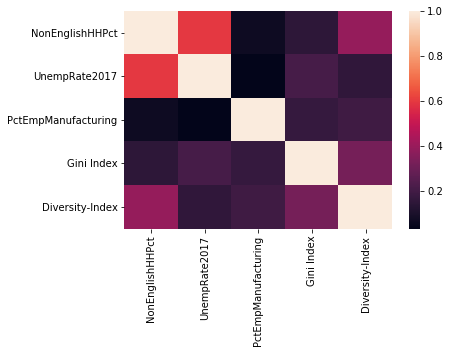

In [368]:
sns.heatmap(uscounties[['NonEnglishHHPct','UnempRate2017','PctEmpManufacturing','Gini Index','Diversity-Index',]].corr().abs())

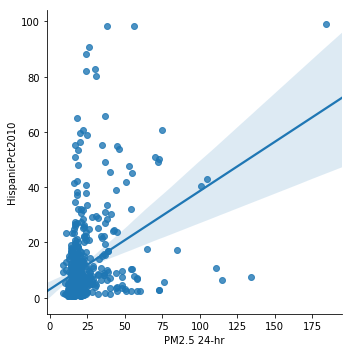

In [369]:
sns.lmplot(x='PM2.5 24-hr',y='HispanicPct2010',data=uscounties)

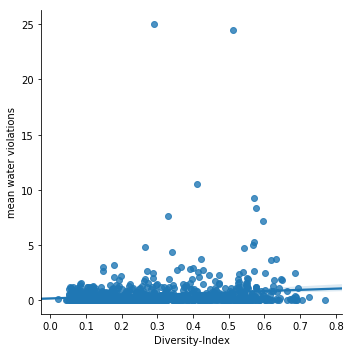

In [370]:
sns.lmplot(x='Diversity-Index',y='mean water violations',data=uscounties)

In [372]:
uscounties[['mean water violations','Diversity-Index','Gini Index','PM2.5 24-hr']].corr(method='spearman')

,mean water violations,Diversity-Index,Gini Index,PM2.5 24-hr
mean water violations,1.000000,0.130461,-0.062600,0.155412
Diversity-Index,0.130461,1.000000,0.329443,0.210425
Gini Index,-0.062600,0.329443,1.000000,0.047747
PM2.5 24-hr,0.155412,0.210425,0.047747,1.000000


In [373]:
uscounties.to_csv('uscounties test.csv')

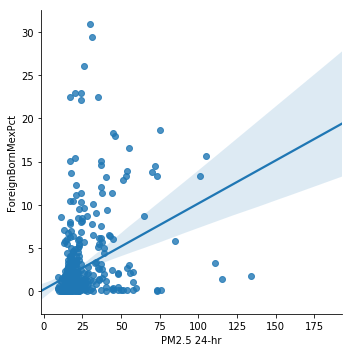

In [374]:
sns.lmplot(x='PM2.5 24-hr',y='ForeignBornMexPct',data=uscounties)

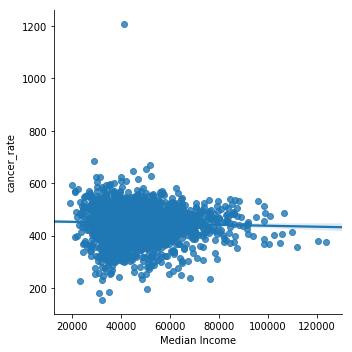

In [375]:
sns.lmplot(x='Median Income',y='cancer_rate',data=uscounties)

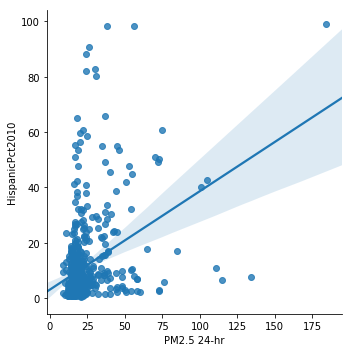

In [376]:
sns.lmplot(x='PM2.5 24-hr',y='HispanicPct2010',data=uscounties)

Now we'll move into actual statistical tests using the Scipy statistics package. 

We'll compare deviations from the mean in population groups. That is, if communities whose minority population exceeds the average is statistically different from communities whose White Non-Hispanic population is greater than or equal to the average. 

In [388]:
data = [go.Heatmap(z=uscounties.values.tolist(), colorscale='Viridis')]

py.iplot(data)

TypeError: Object of type 'Polygon' is not JSON serializable

In [ ]:
# Import statistical package "stats" from SciPy
from scipy import stats

In [ ]:
# First, calculate the mean value for each group. 
white_mean = uscounties['WhiteNonHispanicPct2010'].mean()
hispanic_mean = uscounties['HispanicPct2010'].mean()
black_mean = uscounties['BlackNonHispanicPct2010'].mean()
asian_mean = uscounties['AsianNonHispanicPct2010'].mean()
na_mean = uscounties['NativeAmericanNonHispanicPct2010'].mean()
mixed_mean = uscounties['MultipleRacePct2010'].mean()

In [ ]:
# Let's try testing above mean hispanic population air pollution to above mean white population air pollution.
white_above_pm25 = uscounties[uscounties['WhiteNonHispanicPct2010'] >= white_mean]['PM2.5 24-hr'].dropna()
hispanic_above_pm25 = uscounties[uscounties['HispanicPct2010'] >= hispanic_mean]['PM2.5 24-hr'].dropna()
stats.ttest_ind(white_above_pm25, hispanic_above_pm25)

In [ ]:
# Black
black_above_pm25 = uscounties[uscounties['BlackNonHispanicPct2010'] > black_mean]['PM2.5 24-hr'].dropna()
stats.ttest_ind(white_above_pm25, black_above_pm25)

In [ ]:
# Asian
asian_above_pm25 = uscounties[uscounties['AsianNonHispanicPct2010'] > asian_mean]['PM2.5 24-hr'].dropna()
stats.ttest_ind(white_above_pm25, asian_above_pm25)

In [ ]:
# Native American
na_above_pm25 = uscounties[uscounties['NativeAmericanNonHispanicPct2010'] > na_mean ]['PM2.5 24-hr'].dropna()
stats.ttest_ind(white_above_pm25, na_above_pm25)

In [ ]:
# Mixed Race
mixed_above_pm25 = uscounties[uscounties['MultipleRacePct2010'] > mixed_mean]['PM2.5 24-hr'].dropna()
stats.ttest_ind(white_above_pm25, mixed_above_pm25)

In [ ]:
# There is a statistically significant difference in PM2.5 air contamination in communities
# that have above-mean proportions of minority populations for all groups except Asians. 

# Let's visualise the average PM2.5 contamination levels in these communities.

#Create a new dataframe with only the necessary columns
# pm_df = uscounties[['PM2.5 24-hr','MultipleRacePct2010','NativeAmericanNonHispanicPct2010','AsianNonHispanicPct2010',
                #'BlackNonHispanicPct2010','HispanicPct2010','WhiteNonHispanicPct2010']]

#pm_df = pd.DataFrame()
    
#pm_df['Mixed'] = uscounties[uscounties['MultipleRacePct2010'] >= mixed_mean]['PM2.5 24-hr']
#pm_df['Native American'] = uscounties[uscounties['NativeAmericanNonHispanicPct2010'] >= na_mean ]['PM2.5 24-hr']
#pm_df['Black'] = uscounties[uscounties['BlackNonHispanicPct2010'] >= black_mean]['PM2.5 24-hr']
#pm_df['White'] = uscounties[uscounties['WhiteNonHispanicPct2010'] >= white_mean]['PM2.5 24-hr']
#pm_df['Hispanic'] = uscounties[uscounties['HispanicPct2010'] >= hispanic_mean]['PM2.5 24-hr']

#pm_df.iplot(kind='box')

In [ ]:
#pm_df.mean().iplot(kind='bar')

In [ ]:
from scipy.stats.stats import pearsonr




from scipy.stats.stats import pearsonr


Next, we'll add in US voting data for the 2016 presidential election. It inidicates the amount and proportion of votes for democrats/republicans.
We can find election data here: https://github.com/tonmcg/US_County_Level_Election_Results_08-16.
I'll download this and add it to the running dataframe.

In [ ]:
#electiondata = pd.read_csv('US_County_Level_Election_Results_08-16-master/2016_US_County_Level_Presidential_Results.csv')
#electiondata.head(1) #Again we see there is county name and state abbreviation, we'll drop these then combine at FIPS

In [ ]:
#electiondata = electiondata.drop(['state_abbr','county_name','diff','per_point_diff','Unnamed: 0','votes_dem','votes_gop','total_votes'],axis=1)
#electiondata[['per_dem','per_gop']] = electiondata[['per_dem','per_gop']].astype(float,errors='ignore')
#electiondata.head(1)

In [ ]:
#electiondata = electiondata.rename(index=str, columns={'combined_fips':'FIPS',
                                                      #'per_dem':'Percent Dem 2016',
                                                      #'per_gop':'Percent GOP 2016',
                                                      #})
#electiondata.head(1)

In [ ]:
#uscounties = county_data.merge(electiondata,on='FIPS')
#uscounties.head(1)

In [ ]:
#water = pd.read_csv('water_system_summary.csv')

In [ ]:
#water = water.rename({'State Code':'State','Counties Served':'County'},axis=1)
#water = water.drop(['Unnamed: 4','Unnamed: 5','Unnamed: 6'],axis=1)
#water.head(1)

In [ ]:
# Drop commas, normalize county names.
#water['PopulationServed Count'] = water['PopulationServed Count'].replace(',', '',regex=True)
#water['PopulationServed Count'] = water['PopulationServed Count'].astype(float)

#water['PopulationServed Count'] = water['PopulationServed Count'].replace(',', '',regex=True)
#water['Number of Violations'] = water['Number of Violations'].astype(float)


#water['County'] = water.County.str.replace('County', '')
#water['County'] = water.County.str.replace('City', '')
#water['County'] = water.County.str.replace('Census', '')
#water['County'] = water.County.str.replace('Census-Area', '')
#water['County'] = water.County.str.replace('Area', '')
#water['County'] = water.County.str.replace('Borough', '')
#water['County'] = water.County.str.replace('Parish', '')
#water['County'] = water.County.str.replace('Municipality', '')

#water.head(1)

In [ ]:
#len(water) # There are roughly 146,000 rows for just over 3,100 counties. 

In [ ]:
# Aggregate information about counties together
# Start with just a dataframe of State Codes and Counties

#agg_water = uscounties[['State','County']]
#agg_water['Population Served'] = 0
#agg_water['Water Std Violations'] = 0
#agg_water.head()

In [ ]:
#for i, row in water.iterrows():
#    for x, rows in agg_water.iterrows():
#        if (agg_water['State'][x] == water['State'][i]) and (agg_water['County'][x]==water['County'][i]):
#            agg_water['Population Served'][x] = agg_water['Population Served'][x] + water['PopulationServed Count'][i]
#            agg_water['Water Std Violations'][x] = agg_water['Water Std Violations'][x] + water['Number of Violations'][i]            

In [ ]:
#water['Population Total'] = water.groupby(['State', 'County'])['PopulationServed Count'].transform('sum')
#water['Violations Total'] = water.groupby(['State', 'County'])['Number of Violations'].transform('sum')
#water = water.drop_duplicates(subset=['State', 'County'])

In [ ]:
#water = water.drop(['PopulationServed Count','Number of Violations'],axis=1)

In [ ]:
#We'll create a measure of violations as a proportion of served population, then drop the population column.
#water['waterviolation_prop'] = water['Violations Total']/water['Population Total']
#water.head()

In [ ]:
#water = water.drop(['Population Total'],axis=1)

In [ ]:
#len(water.County)

In [ ]:
#uscounties = uscounties.merge(water,on=['State','County'],how='left')

In [ ]:
#uscounties.head()